In [ ]:
# NLTK con Google Colab
import os
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('treebank')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package treebank to /root/nltk_data...
[nltk_data]   Package treebank is already up-to-date!


True

In [ ]:
# Con Google Colab
! pip install -U -q pip setuptools wheel
! pip install -U -q spacy
! python -m spacy download es_core_news_lg

2022-09-05 22:54:39.285819: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.0/568.0 MB 1.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_lg')


In [ ]:
text="""
El ministro de Salud porteño, Dr. Fernán Quirós, aseguró que hubo acuerdo para limitar el transporte público, la nocturnidad y las reuniones sociales. Sin embargo, hay distintas posturas con los gobiernos nacional y bonaerense sobre qué temperamentos se deben adoptar"""
text

'\nEl ministro de Salud porteño, Dr. Fernán Quirós, aseguró que hubo acuerdo para limitar el transporte público, la nocturnidad y las reuniones sociales. Sin embargo, hay distintas posturas con los gobiernos nacional y bonaerense sobre qué temperamentos se deben adoptar'

## Ejemplo NLTK

In [ ]:
from nltk.text import Text
from nltk.tokenize import word_tokenize
t = Text(word_tokenize(text.lower()))
# https://www.nltk.org/api/nltk.html#nltk.text.Text.index

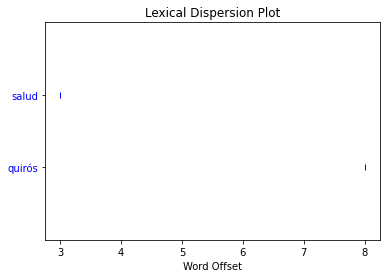

In [ ]:
t.dispersion_plot(['salud','quirós'])

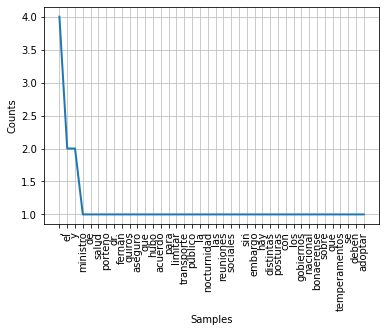

In [ ]:
t.plot(200)

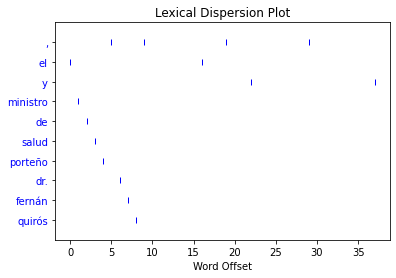

['quirós',
 'fernán',
 'dr.',
 'porteño',
 'salud',
 'de',
 'ministro',
 'y',
 'el',
 ',']

In [ ]:
palabrasMasFrecuentes = [key for key, value in t.vocab().most_common(10)]
t.dispersion_plot(palabrasMasFrecuentes)
palabrasMasFrecuentes

# Ejemplo Spacy

In [ ]:
import spacy
from spacy import displacy
from IPython.core.display import display, HTML
from nltk.tokenize import sent_tokenize

In [ ]:
nlp = spacy.load('es_core_news_lg')

In [ ]:
sent_tokenize

In [ ]:
doc = nlp(sent_tokenize(text.strip())[0])

for entity in doc.ents[:20]:
    print(f"{entity.text} ({entity.label_})")

ministro de Salud (ORG)
Dr. Fernán Quirós (PER)


In [ ]:
displacy.render(doc, style="dep", jupyter=True)

In [ ]:
html = displacy.render(doc, style="ent")
display(HTML(html))

## Ejercicio Practico

1.   Elegir un documento de la Wikipedia y aplicar tecnicas de tokenizacion en el ejemplo visto en clase



In [ ]:
! pip install wikipedia
import wikipedia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11680 sha256=bff9c0420a21e038effa0c78bd10d182b9247b044acaf08f0d947f94853334de
  Stored in directory: /root/.cache/pip/wheels/15/93/6d/5b2c68b8a64c7a7a04947b4ed6d89fb557dcc6bc27d1d7f3ba
Successfully built wikipedia


In [ ]:
subject = 'Barack Obama'

wikipedia.set_lang("es")
wikiResults = wikipedia.search(subject)
wikiPage = wikipedia.page(wikiResults[0]).content

In [ ]:
wikiPage

'Barack Hussein Obama II[1]\u200b ( [bəˈrɑːk huːˈseɪn oʊˈbɑːmə]  en inglés estadounidense; Honolulu, 4 de agosto de 1961) es un político estadounidense que ejerció como el 44.º presidente de los Estados Unidos de América desde el 20 de enero de 2009 hasta el 20 de enero de 2017.[2]\u200b Fue senador por el estado de Illinois desde el 3 de enero de 2005 hasta su renuncia el 16 de noviembre de 2008.[3]\u200b Además, es el quinto legislador afrodescendiente en el Senado de los Estados Unidos, tercero desde la era de reconstrucción. También fue el primer candidato afroestadounidense nominado a la presidencia por el Partido Demócrata y el primero en ejercer el cargo presidencial.[4]\u200b\nSe graduó en la Universidad de Columbia y en la prestigiosa escuela de Derecho Harvard Law School, donde fue presidente de la revista Harvard Law Review.[5]\u200b Posteriormente, trabajó como organizador comunitario y ejerció su carrera como abogado en derechos civiles, antes de ser elegido senador del es

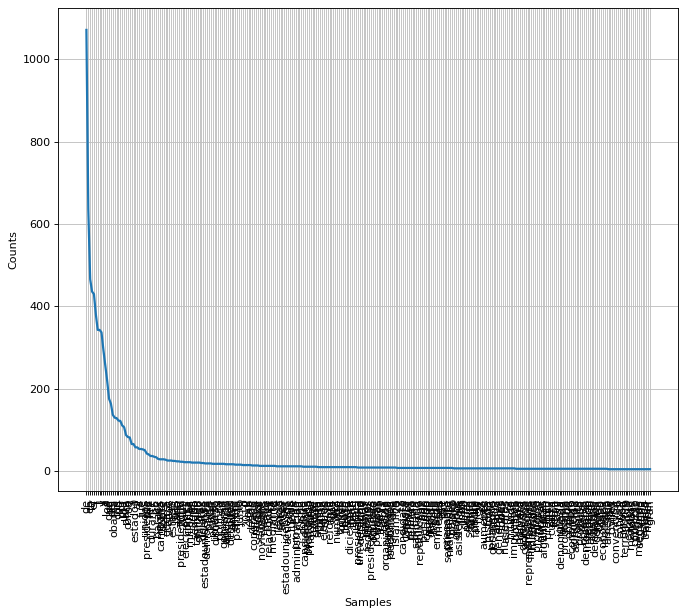

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(10, 8), dpi=80)

t = Text(word_tokenize(wikiPage.lower()))
t.plot(300)

In [ ]:
sent_tokenize(text.strip())[0]

'El ministro de Salud porteño, Dr. Fernán Quirós, aseguró que hubo acuerdo para limitar el transporte público, la nocturnidad y las reuniones sociales.'

In [ ]:
doc = nlp(wikiPage)

for entity in doc.ents[:20]:
    print(f"{entity.text} ({entity.label_})")

Barack Hussein Obama II[1]​ (PER)
Honolulu (LOC)
los Estados Unidos de América (LOC)
Illinois (LOC)
Senado de los Estados Unidos (ORG)
Partido Demócrata (ORG)
Universidad de Columbia (ORG)
Derecho Harvard Law School (ORG)
Harvard Law Review.[5]​ (ORG)
Illinois (LOC)
Derecho de la Universidad de Chicago (MISC)
Cámara de Representantes de los Estados Unidos (ORG)
Senado (ORG)
Convención Nacional Demócrata (ORG)
Senado (ORG)
favor.[6]​
Como (ORG)
Congreso (ORG)
Europa (LOC)
África. (LOC)
110.º Congreso (MISC)


In [ ]:
displacy.render(doc, style="dep", jupyter=True)